# Librerías

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from sklearn.cluster import DBSCAN
import cv2

# Funciones

In [47]:
def convolution_color(image, kernel):
    '''
    Ejecuta la operación de convolución a la imagen de 3 canales con el kernel dado.

    Parámetros:
        image (np.array): imagen de entrada de 3 canales
        kernel (np.array): kernel de convolución

    Retorno:
        np.array: imagen resultante de la convolución
    '''
    # Reflejar el kernel
    kernel = np.flipud(np.fliplr(kernel))

    # Obtener las dimensiones de la imagen y el kernel
    image_h, image_w, image_c = image.shape
    kernel_h, kernel_w = kernel.shape

    # Calcular el padding para cada dimensión (alto y ancho)
    pad_h = kernel_h // 2
    pad_w = kernel_w // 2

    # Crear la imagen con padding, manteniendo las 3 dimensiones
    padded_image = np.zeros((image_h + kernel_h - 1, image_w + kernel_w - 1, image_c))
    padded_image[pad_h:pad_h + image_h, pad_w:pad_w + image_w, :] = image

    # Proceso de convolución
    output = np.zeros_like(image)

    for y in range(image_h):
        for x in range(image_w):
            for c in range(image_c):
                output[y, x, c] = np.sum(kernel * padded_image[y:y+kernel_h, x:x+kernel_w, c])

    # Normalización o clipping de valores fuera de rango
    output = np.clip(output, 0, 255)

    return output

def sized_kernel(size):
    '''
    Crea un kernel de tamaño size x size con valores (1/size^2).

    Parámetros:
        size (int): tamaño del kernel.

    Retorno:
        np.array: kernel de convolución de tamaño size x size.
    '''
    return np.ones((size, size)) / size**2

def binarize(mask, threshold, inverse = False):
    '''
    Binariza la máscara de segmentación con un umbral.

    Parámetros:
        mask (np.array): imagen de entrada.
        threshold (int): umbral de binarización.
    
    Retorno:
        np.array: imagen binarizada.
    '''
    # Verificar si los canales son iguales
    if np.array_equal(mask[:,:,0], mask[:,:,1]) and np.array_equal(mask[:,:,1], mask[:,:,2]):
        # Convertir a escala de grises
        gray_mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

        # Binarizar la imagen
        binary_mask = np.zeros_like(gray_mask)
        if inverse == True:
            _, binary_mask = cv2.threshold(gray_mask, threshold, 255, cv2.THRESH_BINARY_INV)

        else:
            _, binary_mask = cv2.threshold(gray_mask, threshold, 255, cv2.THRESH_BINARY)
        
        return binary_mask
    
def new_binarize(mask):
    '''
    Binariza la máscara de segmentación.

    Parámetros:
        mask (np.array): imagen de entrada.
    
    Retorno:
        np.array: imagen binarizada.
    '''
    # Verificar si los canales son iguales
    if np.array_equal(mask[:,:,0], mask[:,:,1]) and np.array_equal(mask[:,:,1], mask[:,:,2]):
        # Convertir a escala de grises
        gray_mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

        # Binarizar la imagen
        gray_mask[gray_mask == 1] = 3
        gray_mask[gray_mask == 2] = 0
        
        return gray_mask
    
def median_filter_single(image, kernel_size):
    '''
    Aplica un filtro de mediana sobre una imagen en escala de grises
    o que posee un solo canal.

    Parámetros:
        image (np.array): imagen de entrada en escala de grises o canal único.
        kernel_size (int): tamaño de la vecindad (debe ser impar).
    
    Retorno:
        np.array: imagen resultante con el filtro mediana aplicado.
    '''
    # Validar que el tamaño del kernel sea impar
    if kernel_size % 2 == 0:
        raise ValueError("El tamaño del kernel debe ser impar.")

    # Obtener las dimensiones de la imagen
    image_h, image_w = image.shape

    # Aplicar padding a la imagen usando la estrategia 'edge'
    pad = kernel_size // 2
    padded_image = np.pad(image, pad, mode='edge')

    # Crear una imagen de salida
    output = np.zeros_like(image)

    # Proceso de filtro mediana
    for y in range(image_h):
        for x in range(image_w):
            # Extraer la vecindad del pixel (y,x)
            neighborhood = padded_image[y:y + kernel_size, x:x + kernel_size]
            # Calcular la mediana de la vecindad
            output[y, x] = np.median(neighborhood)

    return output

def median_filter(image, kernel_size):
    '''
    Aplica un filtro de mediana sobre una imagen de 3 canales.

    Parámetros:
        image (np.array): imagen de entrada de 3 canales.
        kernel_size (int): tamaño de la vecindad (debe ser impar).

    Retorno:
        np.array: imagen resultante con el filtro mediana aplicado.
    '''
    # Obtener los canales de la imagen
    channel_0 = image[:, :, 0]
    channel_1 = image[:, :, 1]
    channel_2 = image[:, :, 2]

    # Aplicar el filtro de mediana a cada canal
    filtered_channel_0 = median_filter_single(channel_0, kernel_size)
    filtered_channel_1 = median_filter_single(channel_1, kernel_size)
    filtered_channel_2 = median_filter_single(channel_2, kernel_size)

    # Combinar los canales filtrados
    filtered_image = np.stack([filtered_channel_0, filtered_channel_1, filtered_channel_2], axis=-1)

    return filtered_image

def similarity(image_1, image_2):
    '''
    Dadas dos imágenes, devuelve el porcentaje de similitud entre ellas.

    Parámetros:
        image_1 (np.array): primera imagen.
        image_2 (np.array): segunda imagen.

    Retorno:
        float: porcentaje de similitud entre las imágenes.
    '''
    # Obtención de las dimensiones de las imágenes
    h1, w1, c1 = image_1.shape
    h2, w2, c2 = image_2.shape

    # Verificar si las imágenes tienen las mismas dimensiones
    if h1 != h2 or w1 != w2 or c1 != c2:
        raise ValueError("Las imágenes deben tener las mismas dimensiones.")
    
    # Calcular el número de píxeles diferentes
    different_pixels = np.sum(image_1 != image_2)

    # Calcular el porcentaje de similitud
    similarity = 1 - (different_pixels / (h1 * w1 * c1))

    return similarity.round(2) * 100

# Filtros Lineales

In [3]:
# Carga de imágenes
image_path = Path('ImagenesTarea2/cats')
cat_1 = cv2.imread(str(image_path / 'Abyssinian_83.jpg'))
cat_1 = cv2.cvtColor(cat_1, cv2.COLOR_BGR2RGB)

cat_2 = cv2.imread(str(image_path / 'Abyssinian_94.jpg'))
cat_2 = cv2.cvtColor(cat_2, cv2.COLOR_BGR2RGB)

# Carga de máscaras
cat_1_mask = cv2.imread(str(image_path / 'Abyssinian_83.png'))
cat_1_mask = cv2.cvtColor(cat_1_mask, cv2.COLOR_BGR2RGB)
cat_2_mask = cv2.imread(str(image_path / 'Abyssinian_94.png'))
cat_2_mask = cv2.cvtColor(cat_2_mask, cv2.COLOR_BGR2RGB)

## Visualización de imágenes y máscaras asociadas

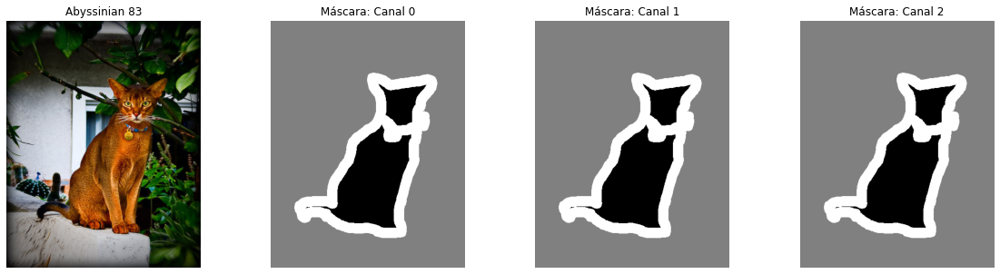

In [4]:
# Visualización de `Abyssinian_83` junto a los 3 canales de la máscara asociada
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(cat_1)
ax[0].axis('off')
ax[0].set_title('Abyssinian 83')

ax[1].imshow(cat_1_mask[:, :, 0], cmap='gray')
ax[1].axis('off')
ax[1].set_title('Máscara: Canal 0')

ax[2].imshow(cat_1_mask[:, :, 1], cmap='gray')
ax[2].axis('off')
ax[2].set_title('Máscara: Canal 1')

ax[3].imshow(cat_1_mask[:, :, 2], cmap='gray')
ax[3].axis('off')
ax[3].set_title('Máscara: Canal 2')

plt.show()

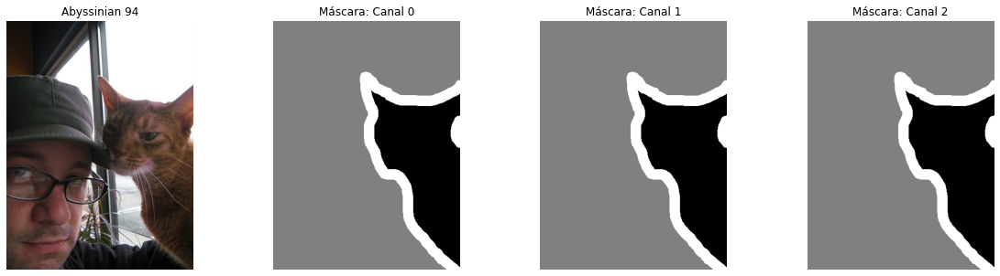

In [5]:
# Visualización de `Abyssinian_94` junto a los 3 canales de la máscara asociada
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(cat_2)
ax[0].axis('off')
ax[0].set_title('Abyssinian 94')

ax[1].imshow(cat_2_mask[:, :, 0], cmap='gray')
ax[1].axis('off')
ax[1].set_title('Máscara: Canal 0')

ax[2].imshow(cat_2_mask[:, :, 1], cmap='gray')
ax[2].axis('off')
ax[2].set_title('Máscara: Canal 1')

ax[3].imshow(cat_2_mask[:, :, 2], cmap='gray')
ax[3].axis('off')
ax[3].set_title('Máscara: Canal 2')

plt.show()

## Máscaras binarizadas

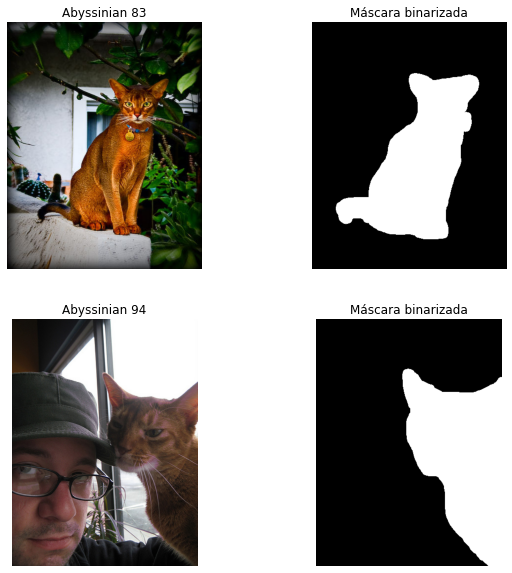

In [6]:
# Binarización de máscara
threshold = 1
bin_cat_1_mask = new_binarize(cat_1_mask)
bin_cat_2_mask = new_binarize(cat_2_mask)

# Visualización de `Abyssinian_83` junto a la máscara binarizada
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
ax[0, 0].imshow(cat_1)
ax[0, 0].axis('off')
ax[0, 0].set_title('Abyssinian 83')

ax[0, 1].imshow(bin_cat_1_mask, cmap='gray')
ax[0, 1].axis('off')
ax[0, 1].set_title('Máscara binarizada')

# Visualización de `Abyssinian_94` junto a la máscara binarizada
ax[1, 0].imshow(cat_2)
ax[1, 0].axis('off')
ax[1, 0].set_title('Abyssinian 94')

ax[1, 1].imshow(bin_cat_2_mask, cmap='gray')
ax[1, 1].axis('off')
ax[1, 1].set_title('Máscara binarizada')

plt.show()

## Proceso de erosión de máscaras

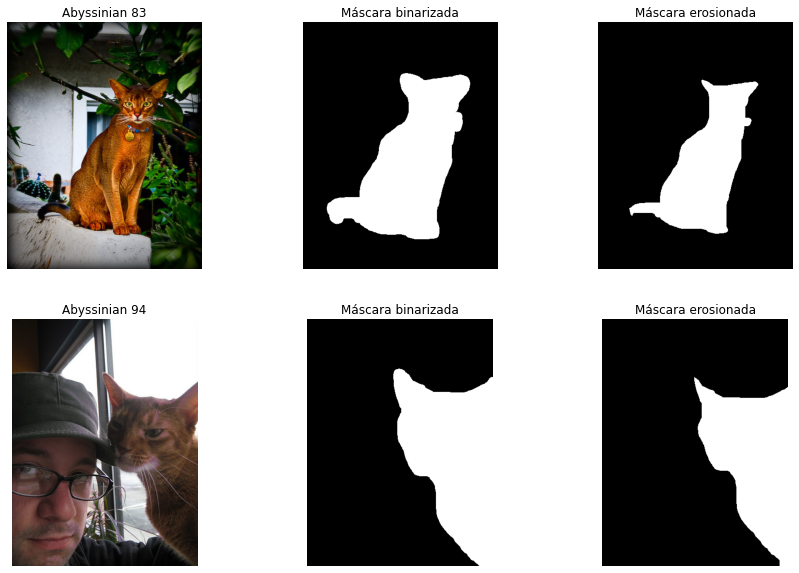

In [7]:
# Operación de erosión
eroded_binary_mask_1 = cv2.erode(bin_cat_1_mask, np.ones((3,3), np.uint8), iterations = 11)
eroded_binary_mask_2 = cv2.erode(bin_cat_2_mask, np.ones((3,3), np.uint8), iterations = 11)

# Visualización de `Abyssinian_83` junto a la máscara binarizada y erosionada
fig, ax = plt.subplots(2, 3, figsize=(15, 10))
ax[0, 0].imshow(cat_1)
ax[0, 0].axis('off')
ax[0, 0].set_title('Abyssinian 83')

ax[0, 1].imshow(bin_cat_1_mask, cmap='gray')
ax[0, 1].axis('off')
ax[0, 1].set_title('Máscara binarizada')

ax[0, 2].imshow(eroded_binary_mask_1, cmap='gray')
ax[0, 2].axis('off')
ax[0, 2].set_title('Máscara erosionada')

# Visualización de `Abyssinian_94` junto a la máscara binarizada y erosionada
ax[1, 0].imshow(cat_2)
ax[1, 0].axis('off')
ax[1, 0].set_title('Abyssinian 94')

ax[1, 1].imshow(bin_cat_2_mask, cmap='gray')
ax[1, 1].axis('off')
ax[1, 1].set_title('Máscara binarizada')

ax[1, 2].imshow(eroded_binary_mask_2, cmap='gray')
ax[1, 2].axis('off')
ax[1, 2].set_title('Máscara erosionada')

plt.show()

## Convolución con filtro creado

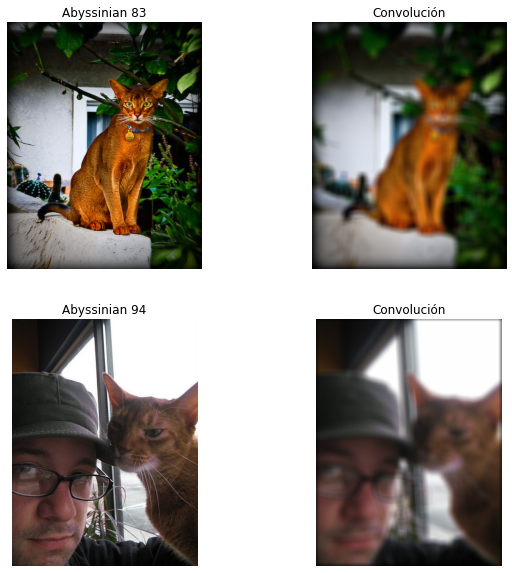

In [8]:
# Convolución entre la imágen a color original y un kernel 15x15
kernel = sized_kernel(15)

conv_cat_1 = convolution_color(cat_1, kernel)
conv_cat_2 = convolution_color(cat_2, kernel)

# Visualización de `Abyssinian_83` junto a la imagen convolucionada
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
ax[0, 0].imshow(cat_1)
ax[0, 0].axis('off')
ax[0, 0].set_title('Abyssinian 83')

ax[0, 1].imshow(conv_cat_1)
ax[0, 1].axis('off')
ax[0, 1].set_title('Convolución')

# Visualización de `Abyssinian_94` junto a la imagen convolucionada
ax[1, 0].imshow(cat_2)
ax[1, 0].axis('off')
ax[1, 0].set_title('Abyssinian 94')

ax[1, 1].imshow(conv_cat_2)
ax[1, 1].axis('off')
ax[1, 1].set_title('Convolución')

plt.show()

## Aplicación de Filtro Gaussiano

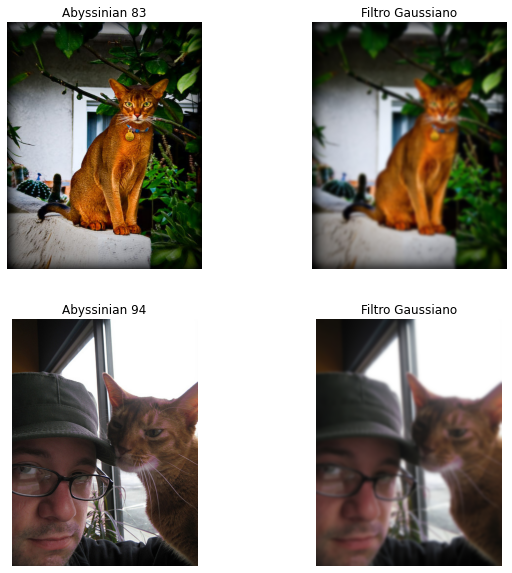

In [9]:
# Aplicación de filtro gaussiano
gaussian_cat_1 = cv2.GaussianBlur(cat_1, (15, 15), 0)
gaussian_cat_2 = cv2.GaussianBlur(cat_2, (15, 15), 0)

# Visualización de `Abyssinian_83` junto a la imagen filtrada con un filtro gaussiano
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
ax[0, 0].imshow(cat_1)
ax[0, 0].axis('off')
ax[0, 0].set_title('Abyssinian 83')

ax[0, 1].imshow(gaussian_cat_1)
ax[0, 1].axis('off')
ax[0, 1].set_title('Filtro Gaussiano')

# Visualización de `Abyssinian_94` junto a la imagen filtrada con un filtro gaussiano
ax[1, 0].imshow(cat_2)
ax[1, 0].axis('off')
ax[1, 0].set_title('Abyssinian 94')

ax[1, 1].imshow(gaussian_cat_2)
ax[1, 1].axis('off')
ax[1, 1].set_title('Filtro Gaussiano')

plt.show()

## Aplicación de máscaras a imágenes filtradas

In [10]:
# Aplicación de máscara erosionada sobre la imagen convolucionada para reemplazo de pixeles
masked_conv_cat_1 = conv_cat_1.copy()
masked_conv_cat_1[eroded_binary_mask_1==3] = cat_1[eroded_binary_mask_1==3]

masked_conv_cat_2 = conv_cat_2.copy()
masked_conv_cat_2[eroded_binary_mask_2==3] = cat_2[eroded_binary_mask_2==3]

# Aplicación de máscara erosionada sobre la imagen filtrada con filtro gaussiano para reemplazo de pixeles
masked_gaussian_cat_1 = gaussian_cat_1.copy()
masked_gaussian_cat_1[eroded_binary_mask_1==3] = cat_1[eroded_binary_mask_1==3]

masked_gaussian_cat_2 = gaussian_cat_2.copy()
masked_gaussian_cat_2[eroded_binary_mask_2==3] = cat_2[eroded_binary_mask_2==3]

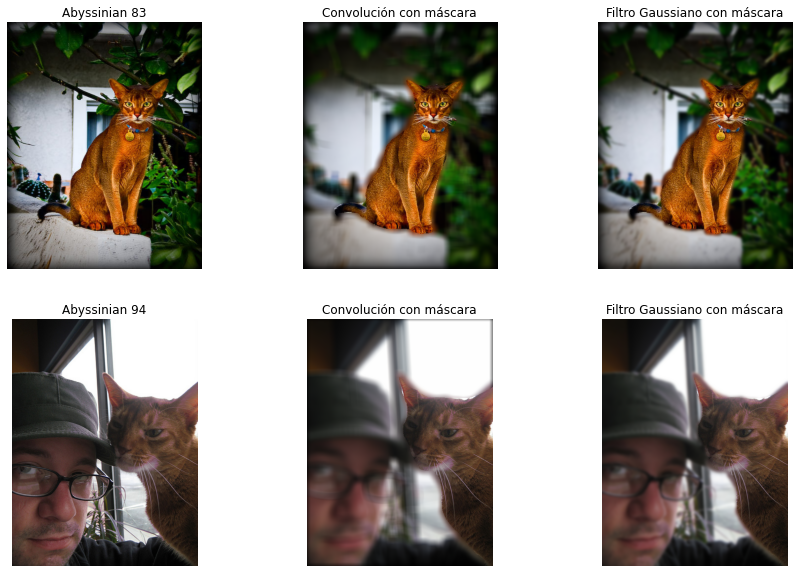

In [11]:
# Visualización de `Abyssinian_83` junto a la imagen convolucionada y filtrada con un filtro gaussiano, ambas con la máscara erosionada
fig, ax = plt.subplots(2, 3, figsize=(15, 10))
ax[0, 0].imshow(cat_1)
ax[0, 0].axis('off')
ax[0, 0].set_title('Abyssinian 83')

ax[0, 1].imshow(masked_conv_cat_1)
ax[0, 1].axis('off')
ax[0, 1].set_title('Convolución con máscara')

ax[0, 2].imshow(masked_gaussian_cat_1)
ax[0, 2].axis('off')
ax[0, 2].set_title('Filtro Gaussiano con máscara')

# Visualización de `Abyssinian_94` junto a la imagen convolucionada y filtrada con un filtro gaussiano, ambas con la máscara erosionada
ax[1, 0].imshow(cat_2)
ax[1, 0].axis('off')
ax[1, 0].set_title('Abyssinian 94')

ax[1, 1].imshow(masked_conv_cat_2)
ax[1, 1].axis('off')
ax[1, 1].set_title('Convolución con máscara')

ax[1, 2].imshow(masked_gaussian_cat_2)
ax[1, 2].axis('off')
ax[1, 2].set_title('Filtro Gaussiano con máscara')

plt.show()

# Filtros No Lineales

In [12]:
# Carga de imágenes
image_path = Path('ImagenesTarea2/sap_noise')

sap_noise_1 = cv2.imread(str(image_path / 'kodim04.png'))
sap_noise_1 = cv2.cvtColor(sap_noise_1, cv2.COLOR_BGR2RGB)
sap_noise_2 = cv2.imread(str(image_path / 'kodim05.png'))
sap_noise_2 = cv2.cvtColor(sap_noise_2, cv2.COLOR_BGR2RGB)
sap_noise_3 = cv2.imread(str(image_path / 'kodim11.png'))
sap_noise_3 = cv2.cvtColor(sap_noise_3, cv2.COLOR_BGR2RGB)
sap_noise_4 = cv2.imread(str(image_path / 'kodim12.png'))
sap_noise_4 = cv2.cvtColor(sap_noise_4, cv2.COLOR_BGR2RGB)
sap_noise_5 = cv2.imread(str(image_path / 'kodim14.png'))
sap_noise_5 = cv2.cvtColor(sap_noise_5, cv2.COLOR_BGR2RGB)

## Visualización de imágenes

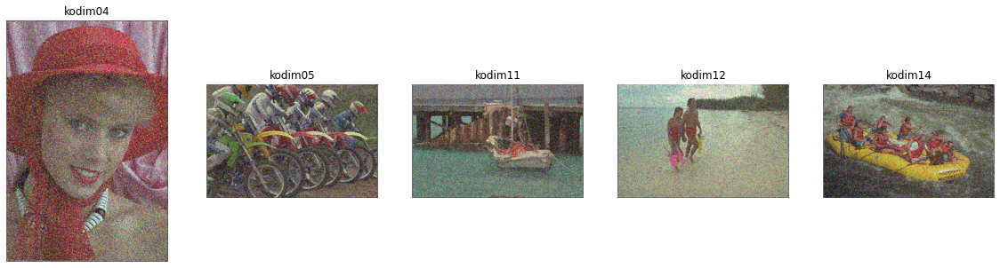

In [13]:
# Visualización de las imágenes cargadas
fig, ax = plt.subplots(1, 5, figsize=(20, 5))
ax[0].imshow(sap_noise_1)
ax[0].axis('off')
ax[0].set_title('kodim04')

ax[1].imshow(sap_noise_2)
ax[1].axis('off')
ax[1].set_title('kodim05')

ax[2].imshow(sap_noise_3)
ax[2].axis('off')
ax[2].set_title('kodim11')

ax[3].imshow(sap_noise_4)
ax[3].axis('off')
ax[3].set_title('kodim12')

ax[4].imshow(sap_noise_5)
ax[4].axis('off')
ax[4].set_title('kodim14')

plt.show()

## Visualización de canales

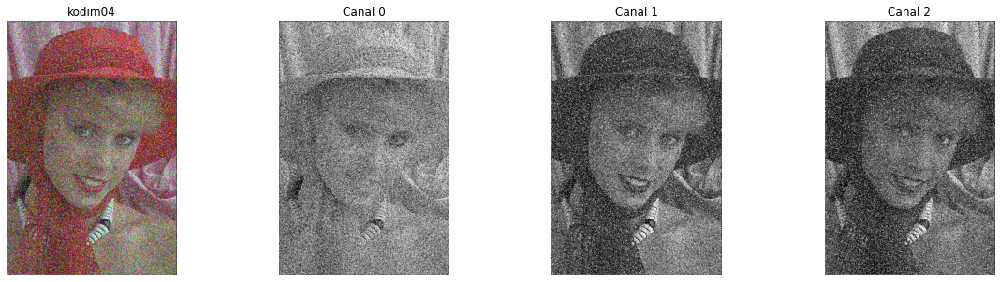

In [14]:
# Visualización de los canales de `kodeim04`
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(sap_noise_1)
ax[0].axis('off')
ax[0].set_title('kodim04')

ax[1].imshow(sap_noise_1[:, :, 0], cmap='gray')
ax[1].axis('off')
ax[1].set_title('Canal 0')

ax[2].imshow(sap_noise_1[:, :, 1], cmap='gray')
ax[2].axis('off')
ax[2].set_title('Canal 1')

ax[3].imshow(sap_noise_1[:, :, 2], cmap='gray')
ax[3].axis('off')
ax[3].set_title('Canal 2')

plt.show()

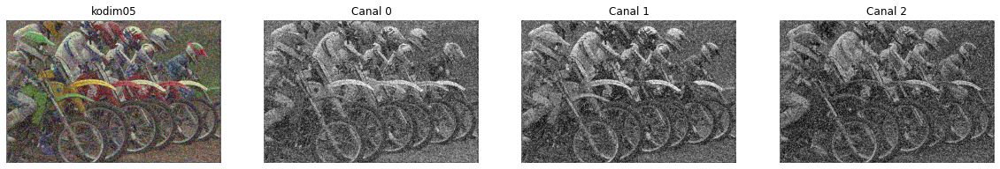

In [15]:
# Visualización de los canales de `kodeim05`
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(sap_noise_2)
ax[0].axis('off')
ax[0].set_title('kodim05')

ax[1].imshow(sap_noise_2[:, :, 0], cmap='gray')
ax[1].axis('off')
ax[1].set_title('Canal 0')

ax[2].imshow(sap_noise_2[:, :, 1], cmap='gray')
ax[2].axis('off')
ax[2].set_title('Canal 1')

ax[3].imshow(sap_noise_2[:, :, 2], cmap='gray')
ax[3].axis('off')
ax[3].set_title('Canal 2')

plt.show()

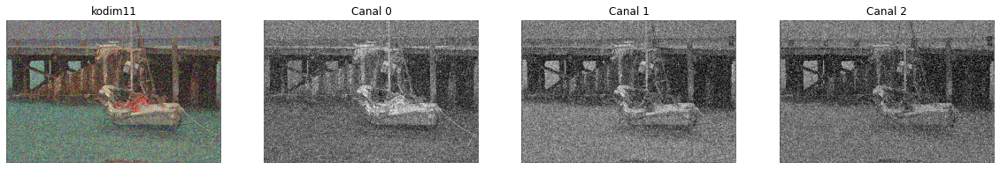

In [16]:
# Visualización de los canales de `kodeim11`
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(sap_noise_3)
ax[0].axis('off')
ax[0].set_title('kodim11')

ax[1].imshow(sap_noise_3[:, :, 0], cmap='gray')
ax[1].axis('off')
ax[1].set_title('Canal 0')

ax[2].imshow(sap_noise_3[:, :, 1], cmap='gray')
ax[2].axis('off')
ax[2].set_title('Canal 1')

ax[3].imshow(sap_noise_3[:, :, 2], cmap='gray')
ax[3].axis('off')
ax[3].set_title('Canal 2')

plt.show()

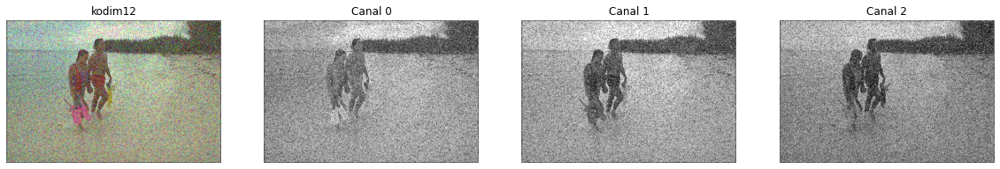

In [17]:
# Visualización de los canales de `kodeim12`
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(sap_noise_4)
ax[0].axis('off')
ax[0].set_title('kodim12')

ax[1].imshow(sap_noise_4[:, :, 0], cmap='gray')
ax[1].axis('off')
ax[1].set_title('Canal 0')

ax[2].imshow(sap_noise_4[:, :, 1], cmap='gray')
ax[2].axis('off')
ax[2].set_title('Canal 1')

ax[3].imshow(sap_noise_4[:, :, 2], cmap='gray')
ax[3].axis('off')
ax[3].set_title('Canal 2')

plt.show()

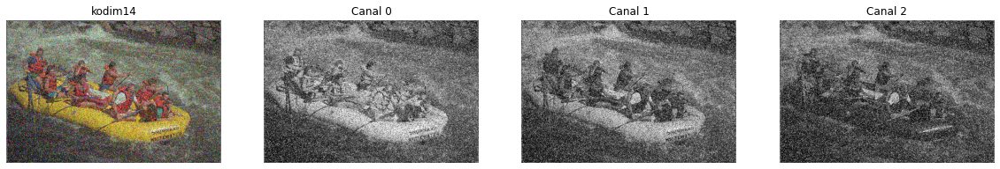

In [18]:
# Visualización de los canales de `kodeim14`
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(sap_noise_5)
ax[0].axis('off')
ax[0].set_title('kodim14')

ax[1].imshow(sap_noise_5[:, :, 0], cmap='gray')
ax[1].axis('off')
ax[1].set_title('Canal 0')

ax[2].imshow(sap_noise_5[:, :, 1], cmap='gray')
ax[2].axis('off')
ax[2].set_title('Canal 1')

ax[3].imshow(sap_noise_5[:, :, 2], cmap='gray')
ax[3].axis('off')
ax[3].set_title('Canal 2')

plt.show()

## Aplicación de Filtro Gaussiano

In [19]:
# Aplicación de filtro gaussiano a las imágenes con ruido
gaussian_sap_noise_1 = cv2.GaussianBlur(sap_noise_1, (5, 5), 0)
gaussian_sap_noise_2 = cv2.GaussianBlur(sap_noise_2, (5, 5), 0)
gaussian_sap_noise_3 = cv2.GaussianBlur(sap_noise_3, (5, 5), 0)
gaussian_sap_noise_4 = cv2.GaussianBlur(sap_noise_4, (5, 5), 0)
gaussian_sap_noise_5 = cv2.GaussianBlur(sap_noise_5, (5, 5), 0)

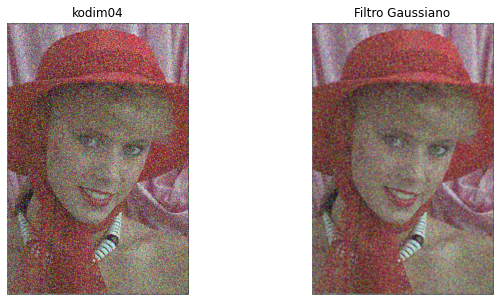

In [21]:
# Visualización de `kodim04` junto a la imagen filtrada con un filtro gaussiano
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_1)
ax[0].axis('off')
ax[0].set_title('kodim04')

ax[1].imshow(gaussian_sap_noise_1)
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

plt.show()

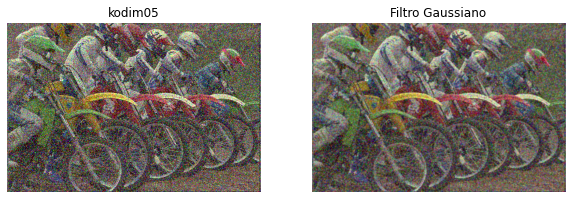

In [22]:
# Visualización de `kodim05` junto a la imagen filtrada con un filtro gaussiano
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_2)
ax[0].axis('off')
ax[0].set_title('kodim05')

ax[1].imshow(gaussian_sap_noise_2)
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

plt.show()

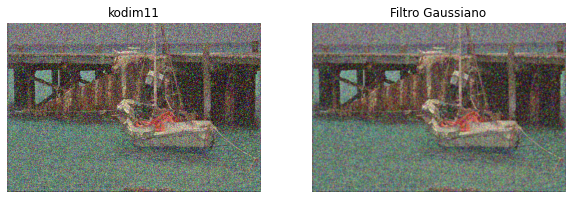

In [23]:
# Visualización de `kodim11` junto a la imagen filtrada con un filtro gaussiano
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_3)
ax[0].axis('off')
ax[0].set_title('kodim11')

ax[1].imshow(gaussian_sap_noise_3)
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

plt.show()

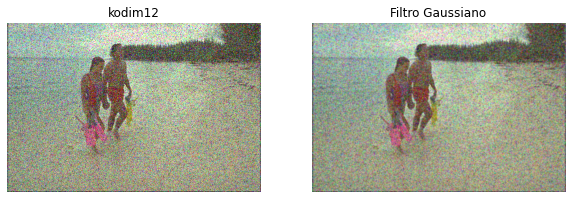

In [24]:
# Visualización de `kodim12` junto a la imagen filtrada con un filtro gaussiano
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_4)
ax[0].axis('off')
ax[0].set_title('kodim12')

ax[1].imshow(gaussian_sap_noise_4)
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

plt.show()

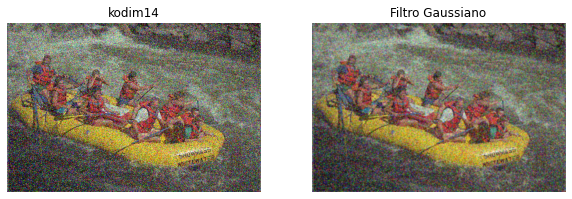

In [25]:
# Visualización de `kodim14` junto a la imagen filtrada con un filtro gaussiano
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_5)
ax[0].axis('off')
ax[0].set_title('kodim14')

ax[1].imshow(gaussian_sap_noise_5)
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

plt.show()

## Aplicación de Filtro de Media

In [26]:
# Aplicación de filtro de mediana a las imágenes con ruido
median_sap_noise_1 = median_filter(sap_noise_1, 5)
median_sap_noise_2 = median_filter(sap_noise_2, 5)
median_sap_noise_3 = median_filter(sap_noise_3, 5)
median_sap_noise_4 = median_filter(sap_noise_4, 5)
median_sap_noise_5 = median_filter(sap_noise_5, 5)

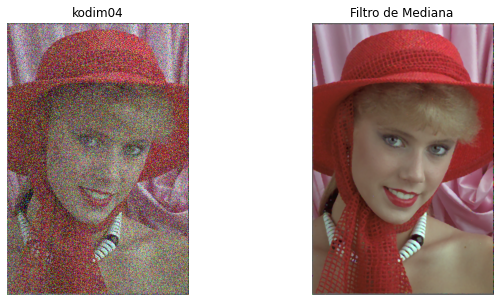

In [27]:
# Visualización de `kodim04` junto a la imagen filtrada con un filtro de mediana
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_1)
ax[0].axis('off')
ax[0].set_title('kodim04')

ax[1].imshow(median_sap_noise_1)
ax[1].axis('off')
ax[1].set_title('Filtro de Mediana')

plt.show()

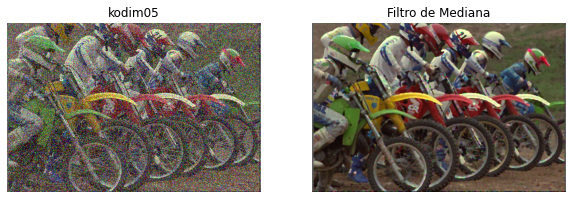

In [28]:
# Visualización de `kodim05` junto a la imagen filtrada con un filtro de mediana
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_2)
ax[0].axis('off')
ax[0].set_title('kodim05')

ax[1].imshow(median_sap_noise_2)
ax[1].axis('off')
ax[1].set_title('Filtro de Mediana')

plt.show()

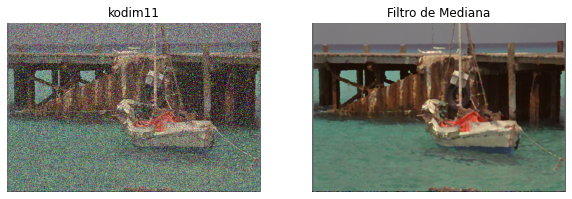

In [29]:
# Visualización de `kodim11` junto a la imagen filtrada con un filtro de mediana
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_3)
ax[0].axis('off')
ax[0].set_title('kodim11')

ax[1].imshow(median_sap_noise_3)
ax[1].axis('off')
ax[1].set_title('Filtro de Mediana')

plt.show()

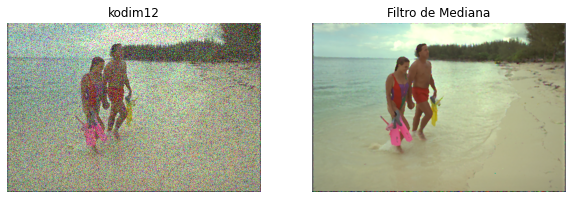

In [30]:
# Visualización de `kodim12` junto a la imagen filtrada con un filtro de mediana
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_4)
ax[0].axis('off')
ax[0].set_title('kodim12')

ax[1].imshow(median_sap_noise_4)
ax[1].axis('off')
ax[1].set_title('Filtro de Mediana')

plt.show()

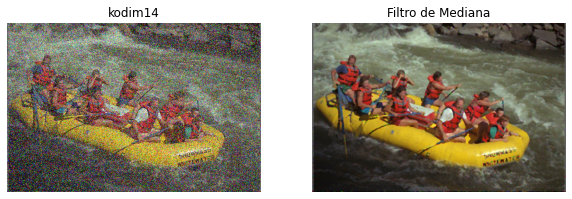

In [31]:
# Visualización de `kodim14` junto a la imagen filtrada con un filtro de mediana
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_5)
ax[0].axis('off')
ax[0].set_title('kodim14')

ax[1].imshow(median_sap_noise_5)
ax[1].axis('off')
ax[1].set_title('Filtro de Mediana')

plt.show()

## Aplicación de Filtro *medianBlur*

In [32]:
# Aplicación de filtro `cv2.medianBlur` a las imágenes con ruido
median_blur_sap_noise_1 = cv2.medianBlur(sap_noise_1, 5)
median_blur_sap_noise_2 = cv2.medianBlur(sap_noise_2, 5)
median_blur_sap_noise_3 = cv2.medianBlur(sap_noise_3, 5)
median_blur_sap_noise_4 = cv2.medianBlur(sap_noise_4, 5)
median_blur_sap_noise_5 = cv2.medianBlur(sap_noise_5, 5)

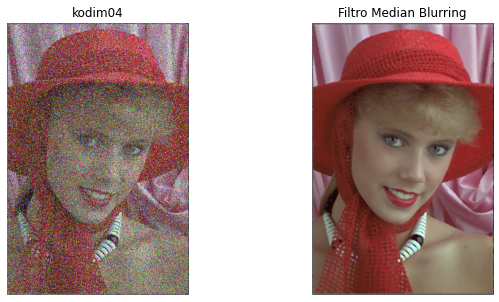

In [33]:
# Visualización de `kodim04` junto a la imagen filtrada con un filtro 'Median Blurring'
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_1)
ax[0].axis('off')
ax[0].set_title('kodim04')

ax[1].imshow(median_blur_sap_noise_1)
ax[1].axis('off')
ax[1].set_title('Filtro Median Blurring')

plt.show()

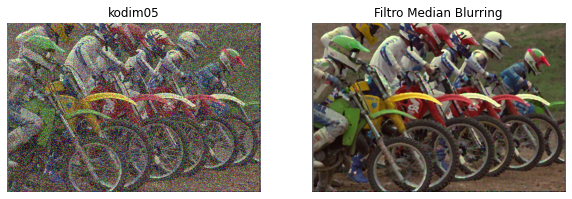

In [34]:
# Visualización de `kodim05` junto a la imagen filtrada con un filtro 'Median Blurring'
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_2)
ax[0].axis('off')
ax[0].set_title('kodim05')

ax[1].imshow(median_blur_sap_noise_2)
ax[1].axis('off')
ax[1].set_title('Filtro Median Blurring')

plt.show()

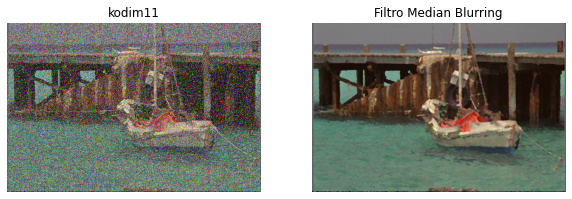

In [35]:
# Visualización de `kodim11` junto a la imagen filtrada con un filtro 'Median Blurring'
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_3)
ax[0].axis('off')
ax[0].set_title('kodim11')

ax[1].imshow(median_blur_sap_noise_3)
ax[1].axis('off')
ax[1].set_title('Filtro Median Blurring')

plt.show()

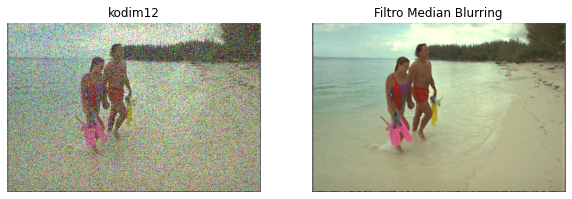

In [36]:
# Visualización de `kodim12` junto a la imagen filtrada con un filtro 'Median Blurring'
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_4)
ax[0].axis('off')
ax[0].set_title('kodim12')

ax[1].imshow(median_blur_sap_noise_4)
ax[1].axis('off')
ax[1].set_title('Filtro Median Blurring')

plt.show()

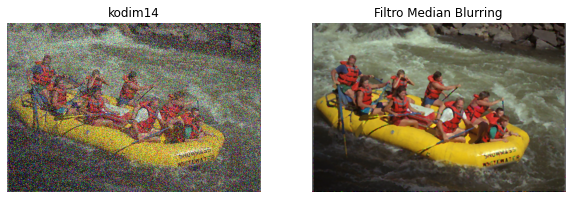

In [37]:
# Visualización de `kodim14` junto a la imagen filtrada con un filtro 'Median Blurring'
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sap_noise_5)
ax[0].axis('off')
ax[0].set_title('kodim14')

ax[1].imshow(median_blur_sap_noise_5)
ax[1].axis('off')
ax[1].set_title('Filtro Median Blurring')

plt.show()

## Vista en conjunto y porcentaje de igualdad

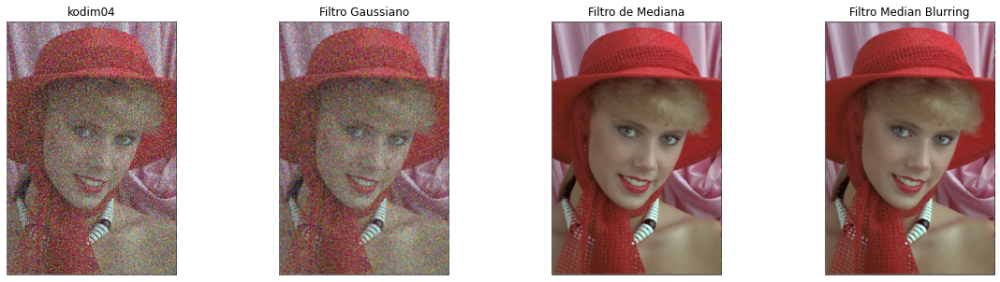

In [38]:
# Vista en conjunto por cada imagen y los filtros aplicados sobre ellas

# Visualización de `kodim04` junto a los filtros aplicados
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(sap_noise_1)
ax[0].axis('off')
ax[0].set_title('kodim04')

ax[1].imshow(gaussian_sap_noise_1)
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

ax[2].imshow(median_sap_noise_1)
ax[2].axis('off')
ax[2].set_title('Filtro de Mediana')

ax[3].imshow(median_blur_sap_noise_1)
ax[3].axis('off')
ax[3].set_title('Filtro Median Blurring')

plt.show()

In [54]:
simil_1 = similarity(median_sap_noise_1, median_blur_sap_noise_1)
print(f'Porcentaje de similitud entre el filtro de mediana y el filtro Median Blurring de kodim04: {simil_1}%')

Porcentaje de similitud entre el filtro de mediana y el filtro Median Blurring de kodim04: 100.0%


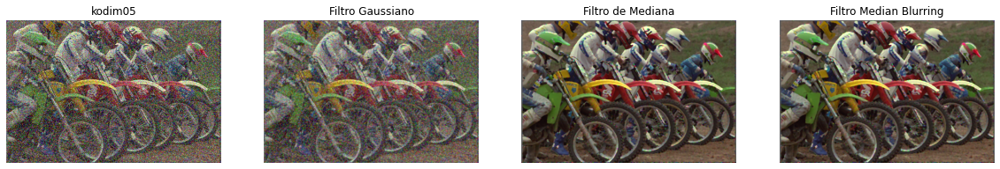

In [39]:
# Visualización de `kodim05` junto a los filtros aplicados
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(sap_noise_2)
ax[0].axis('off')
ax[0].set_title('kodim05')

ax[1].imshow(gaussian_sap_noise_2)
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

ax[2].imshow(median_sap_noise_2)
ax[2].axis('off')
ax[2].set_title('Filtro de Mediana')

ax[3].imshow(median_blur_sap_noise_2)
ax[3].axis('off')
ax[3].set_title('Filtro Median Blurring')

plt.show()

In [49]:
simil_2 = similarity(median_sap_noise_2, median_blur_sap_noise_2)
print(f'Porcentaje de similitud entre el filtro de mediana y el filtro Median Blurring de kodim05: {simil_2}%')

Porcentaje de similitud entre el filtro de mediana y el filtro Median Blurring de kodim05: 100.0%


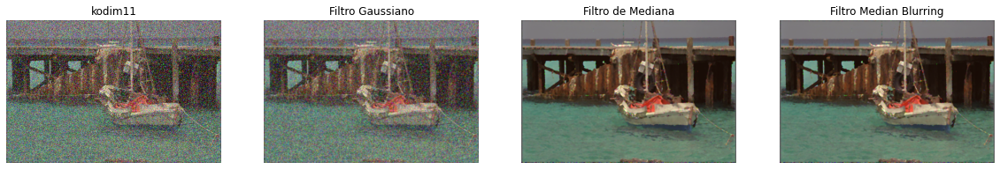

In [40]:
# Visualización de `kodim11` junto a los filtros aplicados
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(sap_noise_3)
ax[0].axis('off')
ax[0].set_title('kodim11')

ax[1].imshow(gaussian_sap_noise_3)
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

ax[2].imshow(median_sap_noise_3)
ax[2].axis('off')
ax[2].set_title('Filtro de Mediana')

ax[3].imshow(median_blur_sap_noise_3)
ax[3].axis('off')
ax[3].set_title('Filtro Median Blurring')

plt.show()

In [50]:
simil_3 = similarity(median_sap_noise_3, median_blur_sap_noise_3)
print(f'Porcentaje de similitud entre el filtro de mediana y el filtro Median Blurring de kodim11: {simil_3}%')

Porcentaje de similitud entre el filtro de mediana y el filtro Median Blurring de kodim11: 100.0%


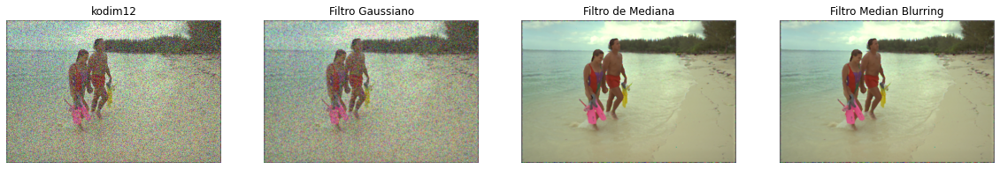

In [41]:
# Visualización de `kodim12` junto a los filtros aplicados
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(sap_noise_4)
ax[0].axis('off')
ax[0].set_title('kodim12')

ax[1].imshow(gaussian_sap_noise_4)
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

ax[2].imshow(median_sap_noise_4)
ax[2].axis('off')
ax[2].set_title('Filtro de Mediana')

ax[3].imshow(median_blur_sap_noise_4)
ax[3].axis('off')
ax[3].set_title('Filtro Median Blurring')

plt.show()

In [51]:
simil_4 = similarity(median_sap_noise_4, median_blur_sap_noise_4)
print(f'Porcentaje de similitud entre el filtro de mediana y el filtro Median Blurring de kodim12: {simil_4}%')

Porcentaje de similitud entre el filtro de mediana y el filtro Median Blurring de kodim12: 100.0%


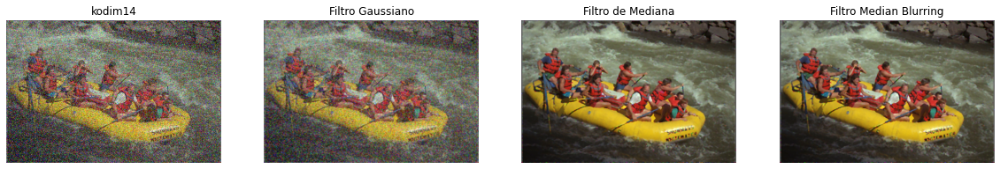

In [42]:
# Visualización de `kodim14` junto a los filtros aplicados
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(sap_noise_5)
ax[0].axis('off')
ax[0].set_title('kodim14')

ax[1].imshow(gaussian_sap_noise_5)
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

ax[2].imshow(median_sap_noise_5)
ax[2].axis('off')
ax[2].set_title('Filtro de Mediana')

ax[3].imshow(median_blur_sap_noise_5)
ax[3].axis('off')
ax[3].set_title('Filtro Median Blurring')

plt.show()

In [52]:
simil_5 = similarity(median_sap_noise_5, median_blur_sap_noise_5)
print(f'Porcentaje de similitud entre el filtro de mediana y el filtro Median Blurring de kodim14: {simil_5}%')

Porcentaje de similitud entre el filtro de mediana y el filtro Median Blurring de kodim14: 100.0%


# Detección de bordes

In [57]:
# Carga de imágenes
image_path = Path('ImagenesTarea2/crack_segmentation')

crack_img_1 = cv2.imread(str(image_path / 'crack_img_1.jpg'))
crack_img_1 = cv2.cvtColor(crack_img_1, cv2.COLOR_BGR2RGB)
crack_img_2 = cv2.imread(str(image_path / 'crack_img_2.jpg'))
crack_img_2 = cv2.cvtColor(crack_img_2, cv2.COLOR_BGR2RGB)
crack_img_3 = cv2.imread(str(image_path / 'crack_img_3.jpg'))
crack_img_3 = cv2.cvtColor(crack_img_3, cv2.COLOR_BGR2RGB)
crack_img_4 = cv2.imread(str(image_path / 'crack_img_4.jpg'))
crack_img_4 = cv2.cvtColor(crack_img_4, cv2.COLOR_BGR2RGB)

# Carga de máscaras
crack_mask_1 = cv2.imread(str(image_path / 'crack_mask_1.jpg'))
crack_mask_1 = cv2.cvtColor(crack_mask_1, cv2.COLOR_BGR2RGB)
crack_mask_2 = cv2.imread(str(image_path / 'crack_mask_2.jpg'))
crack_mask_2 = cv2.cvtColor(crack_mask_2, cv2.COLOR_BGR2RGB)
crack_mask_3 = cv2.imread(str(image_path / 'crack_mask_3.jpg'))
crack_mask_3 = cv2.cvtColor(crack_mask_3, cv2.COLOR_BGR2RGB)
crack_mask_4 = cv2.imread(str(image_path / 'crack_mask_4.jpg'))
crack_mask_4 = cv2.cvtColor(crack_mask_4, cv2.COLOR_BGR2RGB)

## Conversión a escala de grises

In [58]:
# Escala de grises
gray_crack_img_1 = cv2.cvtColor(crack_img_1, cv2.COLOR_RGB2GRAY)
gray_crack_img_2 = cv2.cvtColor(crack_img_2, cv2.COLOR_RGB2GRAY)
gray_crack_img_3 = cv2.cvtColor(crack_img_3, cv2.COLOR_RGB2GRAY)
gray_crack_img_4 = cv2.cvtColor(crack_img_4, cv2.COLOR_RGB2GRAY)

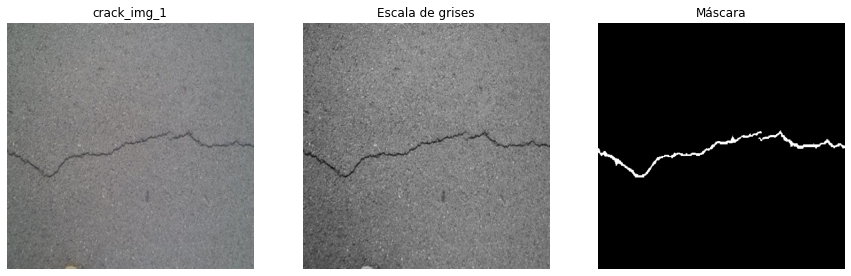

In [61]:
# Visualización de `crack_img_1` junto a su transformación a escala de grises y su máscara
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(crack_img_1)
ax[0].axis('off')
ax[0].set_title('crack_img_1')

ax[1].imshow(gray_crack_img_1, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Escala de grises')

ax[2].imshow(crack_mask_1, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Máscara')

plt.show()

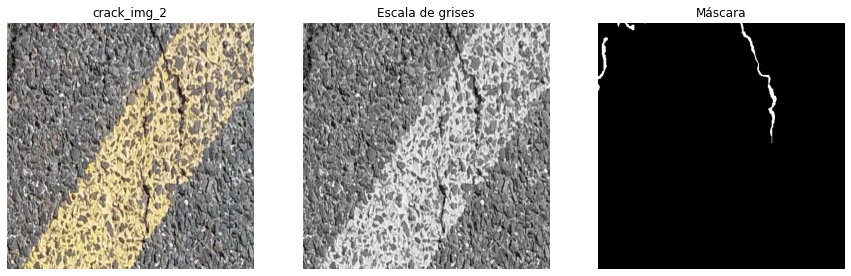

In [68]:
# Visualización de `crack_img_2` junto a su transformación a escala de grises y su máscara
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(crack_img_2)
ax[0].axis('off')
ax[0].set_title('crack_img_2')

ax[1].imshow(gray_crack_img_2, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Escala de grises')

ax[2].imshow(crack_mask_2, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Máscara')

plt.show()

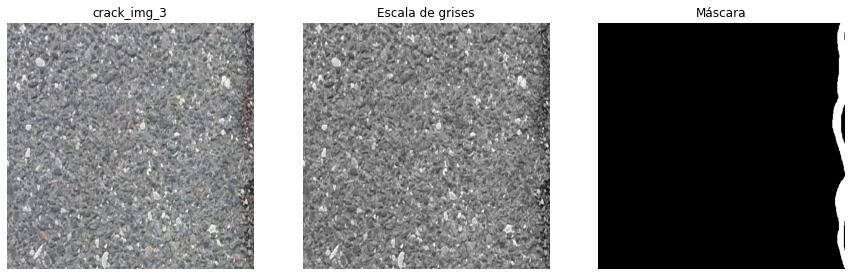

In [63]:
# Visualización de `crack_img_3` junto a su transformación a escala de grises y su máscara
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(crack_img_3)
ax[0].axis('off')
ax[0].set_title('crack_img_3')

ax[1].imshow(gray_crack_img_3, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Escala de grises')

ax[2].imshow(crack_mask_3, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Máscara')

plt.show()

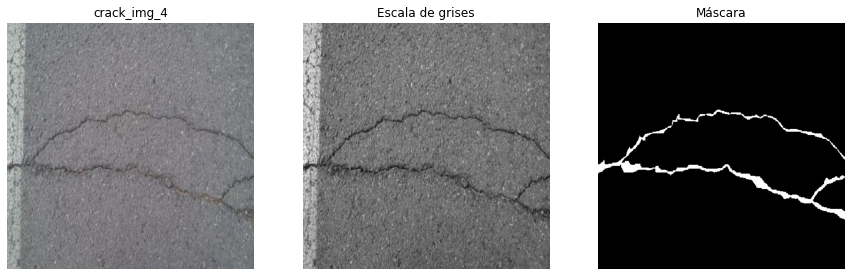

In [64]:
# Visualización de `crack_img_4` junto a su transformación a escala de grises y su máscara
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(crack_img_4)
ax[0].axis('off')
ax[0].set_title('crack_img_4')

ax[1].imshow(gray_crack_img_4, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Escala de grises')

ax[2].imshow(crack_mask_4, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Máscara')

plt.show()

## Aplicación de Filtro Gaussiano

In [69]:
# Aplicación de filtro gaussiano a las imágenes en escala de grises
gaussian_gray_crack_img_1 = cv2.GaussianBlur(gray_crack_img_1, (3, 3), 0)
gaussian_gray_crack_img_2 = cv2.GaussianBlur(gray_crack_img_2, (3, 3), 0)
gaussian_gray_crack_img_3 = cv2.GaussianBlur(gray_crack_img_3, (3, 3), 0)
gaussian_gray_crack_img_4 = cv2.GaussianBlur(gray_crack_img_4, (3, 3), 0)

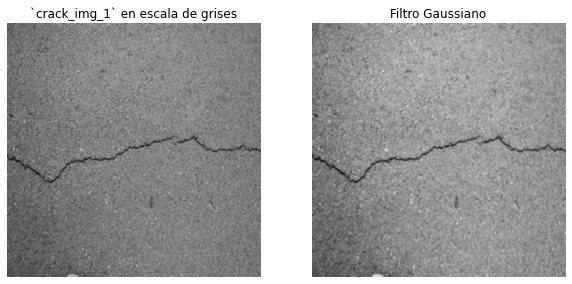

In [70]:
# Visualización de `gray_crack_img_1` junto a su transformación con un filtro gaussiano
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(gray_crack_img_1, cmap='gray')
ax[0].axis('off')
ax[0].set_title('`crack_img_1` en escala de grises')

ax[1].imshow(gaussian_gray_crack_img_1, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

plt.show()

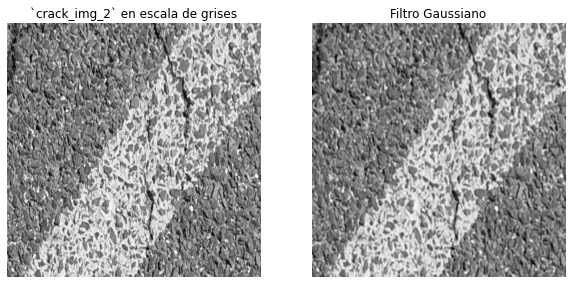

In [71]:
# Visualización de `gray_crack_img_2` junto a su transformación con un filtro gaussiano
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(gray_crack_img_2, cmap='gray')
ax[0].axis('off')
ax[0].set_title('`crack_img_2` en escala de grises')

ax[1].imshow(gaussian_gray_crack_img_2, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

plt.show()

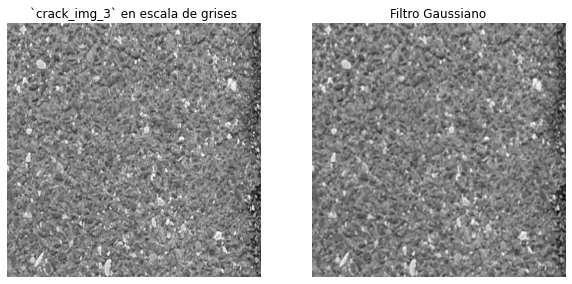

In [72]:
# Visualización de `gray_crack_img_3` junto a su transformación con un filtro gaussiano
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(gray_crack_img_3, cmap='gray')
ax[0].axis('off')
ax[0].set_title('`crack_img_3` en escala de grises')

ax[1].imshow(gaussian_gray_crack_img_3, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

plt.show()

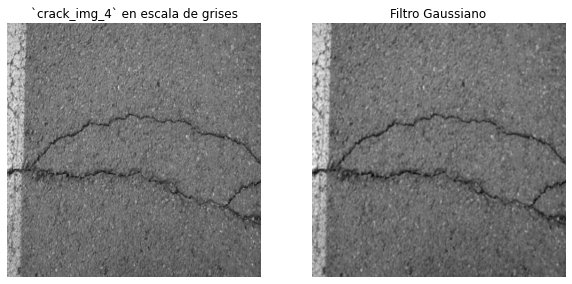

In [73]:
# Visualización de `gray_crack_img_4` junto a su transformación con un filtro gaussiano
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(gray_crack_img_4, cmap='gray')
ax[0].axis('off')
ax[0].set_title('`crack_img_4` en escala de grises')

ax[1].imshow(gaussian_gray_crack_img_4, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Filtro Gaussiano')

plt.show()

## Detección de Bordes

In [95]:
# Detección de bordes con el filtro de Canny
THRESH_1 = 50
THRESH_2 = 200

canny_crack_img_1 = cv2.Canny(crack_img_1, THRESH_1, THRESH_2)
canny_gaussian_gray_crack_img_1 = cv2.Canny(gaussian_gray_crack_img_1, THRESH_1, THRESH_2)

canny_crack_img_2 = cv2.Canny(crack_img_2, THRESH_1, THRESH_2)
canny_gaussian_gray_crack_img_2 = cv2.Canny(gaussian_gray_crack_img_2, THRESH_1, THRESH_2)

canny_crack_img_3 = cv2.Canny(crack_img_3, THRESH_1, THRESH_2)
canny_gaussian_gray_crack_img_3 = cv2.Canny(gaussian_gray_crack_img_3, THRESH_1, THRESH_2)

canny_crack_img_4 = cv2.Canny(crack_img_4, THRESH_1, THRESH_2)
canny_gaussian_gray_crack_img_4 = cv2.Canny(gaussian_gray_crack_img_4, THRESH_1, THRESH_2)

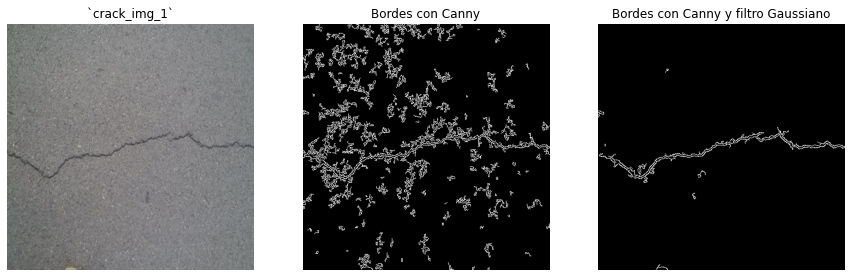

In [96]:
# Visualización de bordes detectados en `crack_img_1` y `gaussian_gray_crack_img_1`
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(crack_img_1)
ax[0].axis('off')
ax[0].set_title('`crack_img_1`')

ax[1].imshow(canny_crack_img_1, cmap = 'gray')
ax[1].axis('off')
ax[1].set_title('Bordes con Canny')

ax[2].imshow(canny_gaussian_gray_crack_img_1, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Bordes con Canny y filtro Gaussiano')

plt.show()

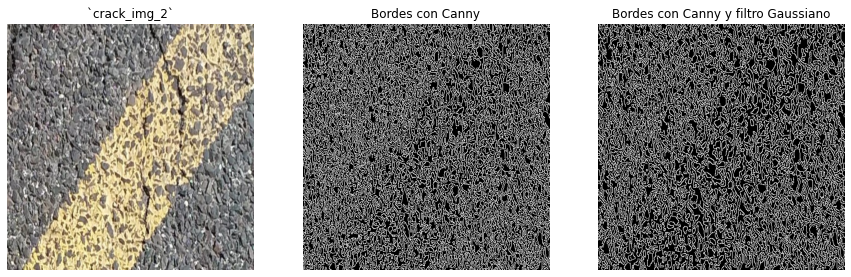

In [97]:
# Visualización de bordes detectados en `crack_img_2` y `gaussian_gray_crack_img_2`
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(crack_img_2)
ax[0].axis('off')
ax[0].set_title('`crack_img_2`')

ax[1].imshow(canny_crack_img_2, cmap = 'gray')
ax[1].axis('off')
ax[1].set_title('Bordes con Canny')

ax[2].imshow(canny_gaussian_gray_crack_img_2, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Bordes con Canny y filtro Gaussiano')

plt.show()

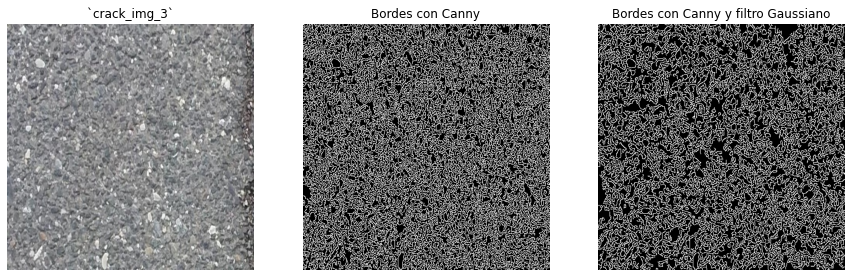

In [98]:
# Visualización de bordes detectados en `crack_img_3` y `gaussian_gray_crack_img_3`
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(crack_img_3)
ax[0].axis('off')
ax[0].set_title('`crack_img_3`')

ax[1].imshow(canny_crack_img_3, cmap = 'gray')
ax[1].axis('off')
ax[1].set_title('Bordes con Canny')

ax[2].imshow(canny_gaussian_gray_crack_img_3, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Bordes con Canny y filtro Gaussiano')

plt.show()

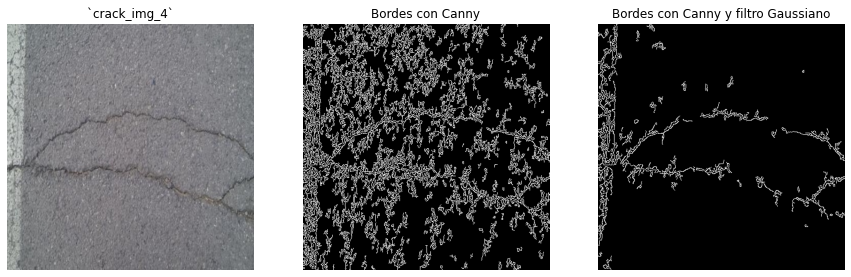

In [99]:
# Visualización de bordes detectados en `crack_img_4` y `gaussian_gray_crack_img_4`
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(crack_img_4)
ax[0].axis('off')
ax[0].set_title('`crack_img_4`')

ax[1].imshow(canny_crack_img_4, cmap = 'gray')
ax[1].axis('off')
ax[1].set_title('Bordes con Canny')

ax[2].imshow(canny_gaussian_gray_crack_img_4, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Bordes con Canny y filtro Gaussiano')

plt.show()

## Operación Morfológica de Cierre

In [100]:
# Aplicación de operaciones morfológicas
closed_crack_img_1 = cv2.morphologyEx(canny_gaussian_gray_crack_img_1, cv2.MORPH_CLOSE,np.ones((3,3), np.uint8), iterations=2)
closed_crack_img_2 = cv2.morphologyEx(canny_gaussian_gray_crack_img_2, cv2.MORPH_CLOSE,np.ones((3,3), np.uint8), iterations=2)
closed_crack_img_3 = cv2.morphologyEx(canny_gaussian_gray_crack_img_3, cv2.MORPH_CLOSE,np.ones((3,3), np.uint8), iterations=2)
closed_crack_img_4 = cv2.morphologyEx(canny_gaussian_gray_crack_img_4, cv2.MORPH_CLOSE,np.ones((3,3), np.uint8), iterations=2)

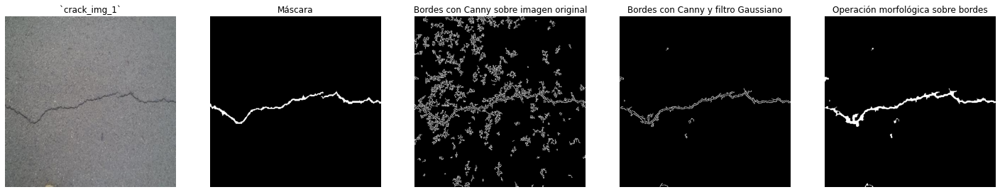

In [101]:
# Visualización de 'crack_img_1' con su máscara, detección de bordes y operación morfológica
fig, ax = plt.subplots(1, 5, figsize=(25, 5))
ax[0].imshow(crack_img_1)
ax[0].axis('off')
ax[0].set_title('`crack_img_1`')

ax[1].imshow(crack_mask_1, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Máscara')

ax[2].imshow(canny_crack_img_1, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Bordes con Canny sobre imagen original')

ax[3].imshow(canny_gaussian_gray_crack_img_1, cmap='gray')
ax[3].axis('off')
ax[3].set_title('Bordes con Canny y filtro Gaussiano')

ax[4].imshow(closed_crack_img_1, cmap='gray')
ax[4].axis('off')
ax[4].set_title('Operación morfológica sobre bordes')

plt.show()

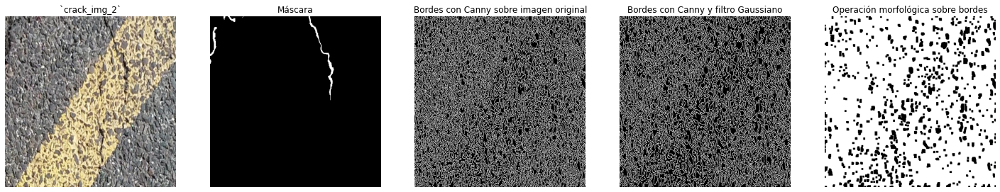

In [102]:
# Visualización de 'crack_img_2' con su máscara, detección de bordes y operación morfológica
fig, ax = plt.subplots(1, 5, figsize=(25, 5))
ax[0].imshow(crack_img_2)
ax[0].axis('off')
ax[0].set_title('`crack_img_2`')

ax[1].imshow(crack_mask_2, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Máscara')

ax[2].imshow(canny_crack_img_2, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Bordes con Canny sobre imagen original')

ax[3].imshow(canny_gaussian_gray_crack_img_2, cmap='gray')
ax[3].axis('off')
ax[3].set_title('Bordes con Canny y filtro Gaussiano')

ax[4].imshow(closed_crack_img_2, cmap='gray')
ax[4].axis('off')
ax[4].set_title('Operación morfológica sobre bordes')

plt.show()

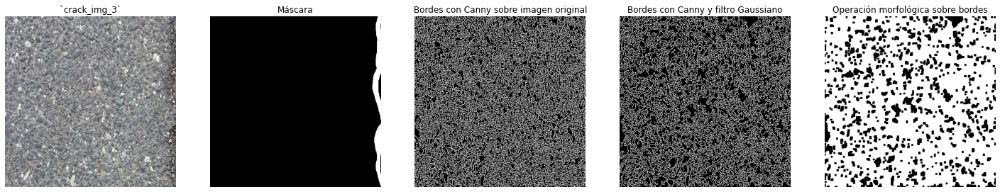

In [104]:
# Visualización de 'crack_img_3' con su máscara, detección de bordes y operación morfológica
fig, ax = plt.subplots(1, 5, figsize=(25, 5))
ax[0].imshow(crack_img_3)
ax[0].axis('off')
ax[0].set_title('`crack_img_3`')

ax[1].imshow(crack_mask_3, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Máscara')

ax[2].imshow(canny_crack_img_3, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Bordes con Canny sobre imagen original')

ax[3].imshow(canny_gaussian_gray_crack_img_3, cmap='gray')
ax[3].axis('off')
ax[3].set_title('Bordes con Canny y filtro Gaussiano')

ax[4].imshow(closed_crack_img_3, cmap='gray')
ax[4].axis('off')
ax[4].set_title('Operación morfológica sobre bordes')

plt.show()

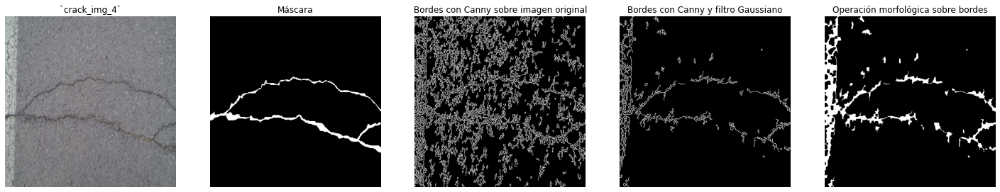

In [105]:
# Visualización de 'crack_img_4' con su máscara, detección de bordes y operación morfológica
fig, ax = plt.subplots(1, 5, figsize=(25, 5))
ax[0].imshow(crack_img_4)
ax[0].axis('off')
ax[0].set_title('`crack_img_4`')

ax[1].imshow(crack_mask_4, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Máscara')

ax[2].imshow(canny_crack_img_4, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Bordes con Canny sobre imagen original')

ax[3].imshow(canny_gaussian_gray_crack_img_4, cmap='gray')
ax[3].axis('off')
ax[3].set_title('Bordes con Canny y filtro Gaussiano')

ax[4].imshow(closed_crack_img_4, cmap='gray')
ax[4].axis('off')
ax[4].set_title('Operación morfológica sobre bordes')

plt.show()

## Métricas para segmentación